In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
from scipy.optimize import curve_fit
import os
import pandas as pd

In [4]:
prepath = '/home/emmanuel/serv_social/datos_para_graficar/Correct_data_forplotting/'

def plotRD(country,scale,ngrams,timeint,totalgrams,ax=None):
    """ Plot rank diversity using 4 different parameters 
    Input: 
    Country (str)<- Mexico,United_Kingdom
    scale (int) <- (-1,0,1)
    ngrams (int) <- (1,2,3,4,5)
    timeint (int) <- (3,6,12,24,48,96)
    """
    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}
    if scale != -1:
        path = prepath+'{}/{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,admins[country][scale],totalgrams,timeint,ngrams)
    else:
        path = prepath+'{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,totalgrams,timeint,ngrams)
        
    data = np.loadtxt(path)
    
    if not ax:
        fig = plt.figure(figsize=(10,7))
        ax = fig.add_subplot(1,1,1)
        if scale != -1:ax.set_title("{},{},ngrams={},$\delta t$={}".format(country,admins[country][scale],ngrams,timeint))
        else:ax.set_title("{},ngrams={},$\delta t$={}".format(country,ngrams,timeint))
        ax.grid(which='both')
    if scale != -1:
        ax.plot(data[:,0],data[:,1],label='{},{},$\delta t$={},ng={}'.format(country,admins[country][scale],timeint,ngrams))
    else:
        ax.plot(data[:,0],data[:,1],label='{},$\delta t$={},ng={}'.format(country,timeint,ngrams))
    ax.set_xlabel("$k$",fontsize=20)
    ax.set_ylabel('d(k)',fontsize=20)
    ax.set_xscale('log')
#     ------------------------------------------------------------
def EvalnormCdf(x,mu,sigma):
    return scipy.stats.norm.cdf(np.log10(x),loc=mu,scale=sigma)

def ajuste(data_fit,funcion):
    X = data_fit[:,0]
    Y = data_fit[:,1]
    param_model, pcov1 = curve_fit(funcion,X,Y)
    return param_model

def plotnormCdfFit(country,scale,ngrams,timeint,totalgrams,ax=None):
    
    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}
    if scale != -1:
        path = prepath+'{}/{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,admins[country][scale],totalgrams,timeint,ngrams)
    else:
        path = prepath+'{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,totalgrams,timeint,ngrams)
        
    data = np.loadtxt(path)
    parametros = ajuste(data,EvalnormCdf)
    
    if not ax:
        fig = plt.figure(figsize=(10,7))
        ax = fig.add_subplot(1,1,1)
        ax.grid(which='both')
    ax.plot(data[:,0],EvalnormCdf(data[:,0],*parametros),'--',label="$\mu$={:.3},$\sigma$={:.3}".format(*parametros))
#     ax.plot(np.log10(data[:,0]),EvalnormCdf(data[:,0],*parametros),'--',label="$\mu$={:.3},$\sigma$={:.3}".format(*parametros))
    ax.set_xlabel("k",fontsize=20)
    ax.set_ylabel('d(k)',fontsize=20)
    ax.set_xscale('log')

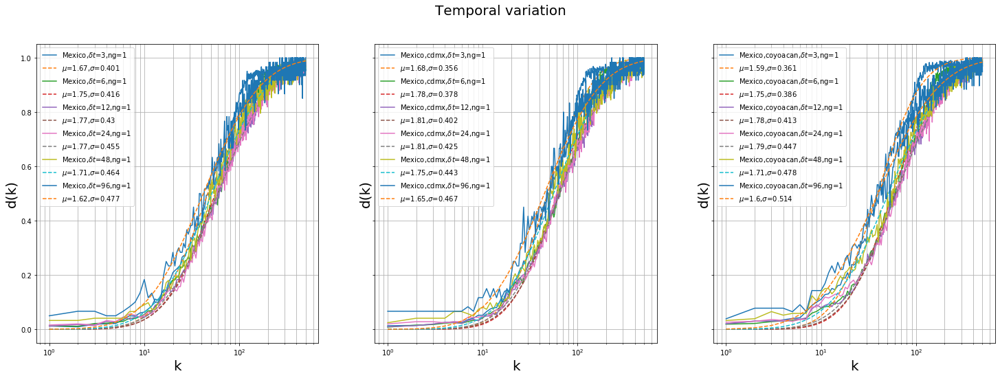

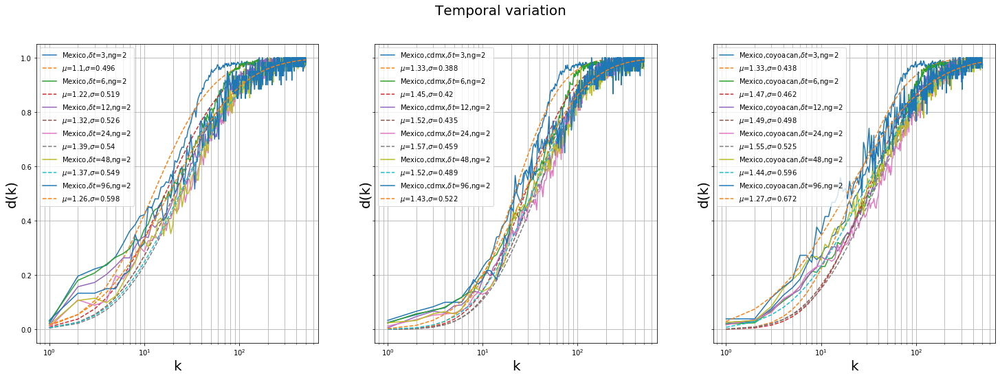

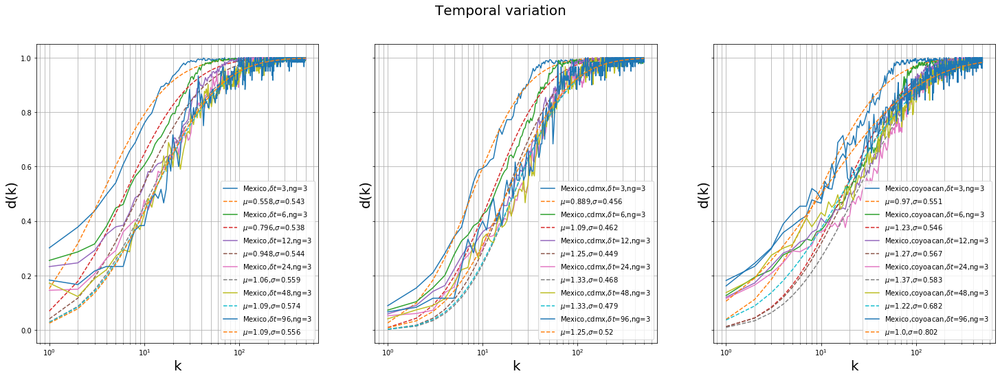

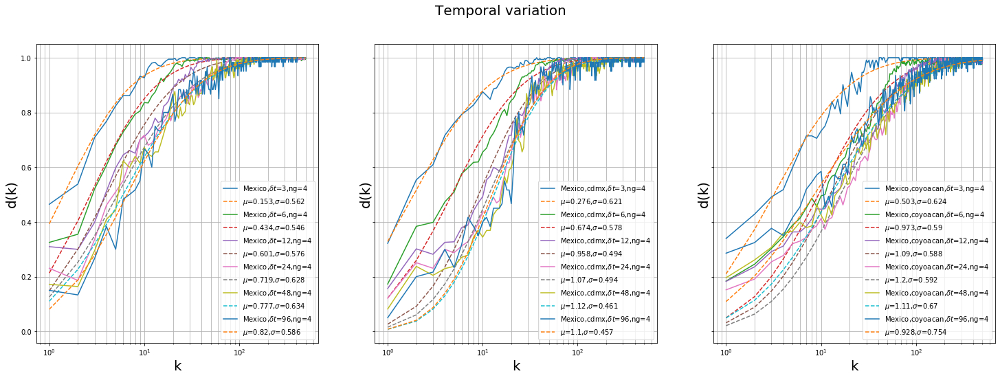

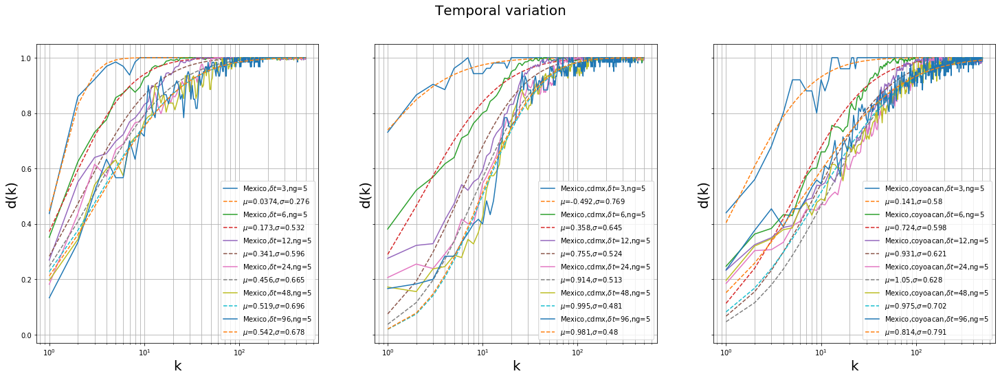

...

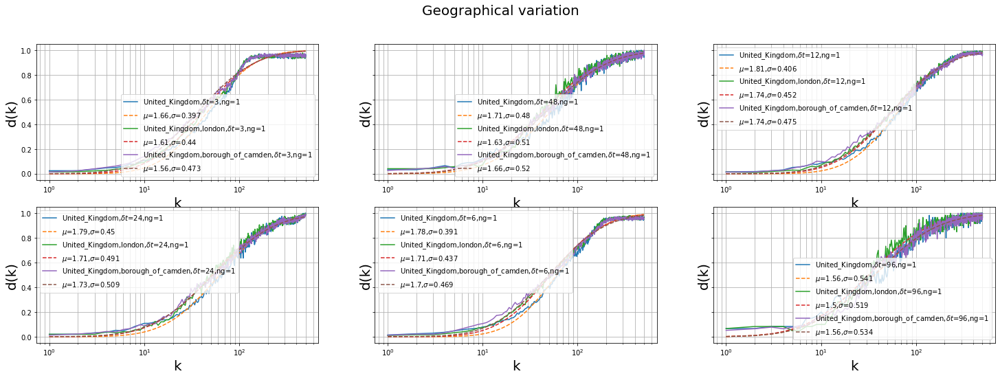

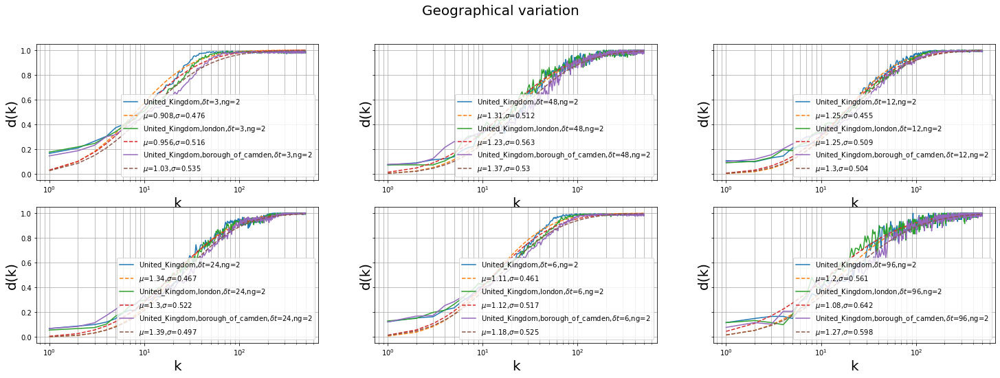

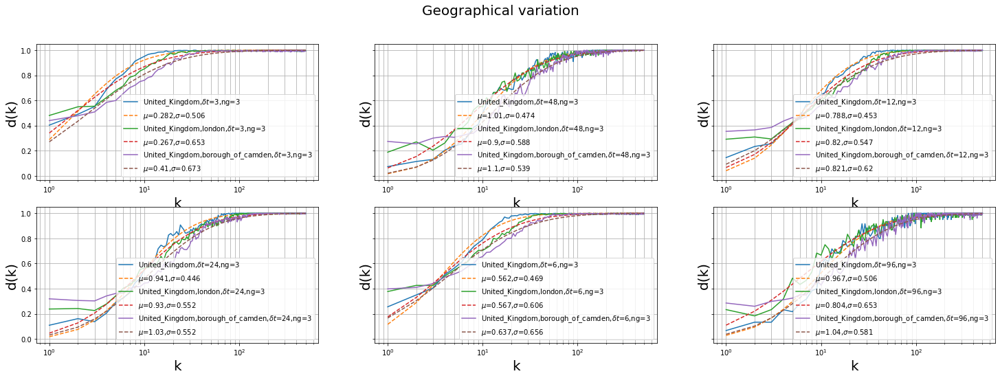

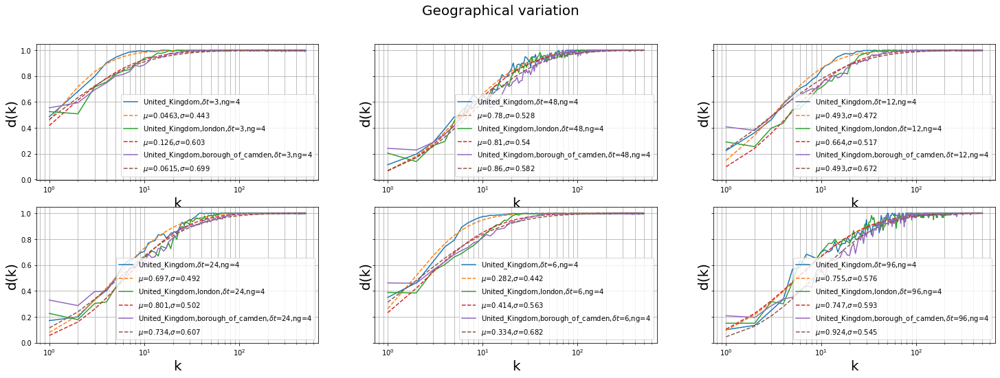

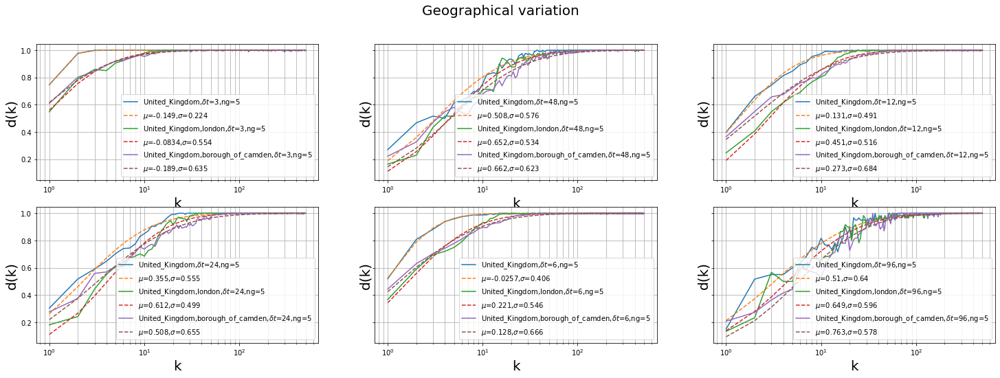

In [5]:
NGRAMS = [1,2,3,4,5]
TIME = [3,6,12,24,48,96]
SPATIAL = [-1,0,1]
countries = ["Mexico", "United_Kingdom"]
MAPEO = {"Mexico":{-1:"Mexico",0:"CDMX",1:"COYO"}, "United_Kingdom":{-1:"United_Kingdom",0:"London",1:"Camden"} }

path = os.path.join(os.getenv("HOME"),'serv_social','datos_para_graficar','Correct_data_forplotting','log_subplotsRD')
totalgrams = 500

for country in countries:
    ##Displaying time variation
    for ngrams in NGRAMS:
        fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(25,8),sharey=True)
        for i,scale in enumerate(SPATIAL):
            for t in TIME:
                plotRD(country,scale,ngrams,t,ax=ax[i],totalgrams=totalgrams)            
            
                plotnormCdfFit(country,scale,ngrams,t,totalgrams=totalgrams,ax=ax[i])

            ax[i].grid(which="both")
            ax[i].legend()
            plt.suptitle('Temporal variation',fontsize=20)
        saving_path=os.path.join(path,country,'displaying_time','{}grams'.format(ngrams))
        if not os.path.exists(saving_path):
            os.makedirs(saving_path)
        plt.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')

    ##Displaying ngrams variation
        
    for timeint in TIME:
        fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(25,8),sharey=True)
        for i,scale in enumerate(SPATIAL):
            for ngram in NGRAMS:
                plotRD(country,scale,ngrams=ngram,timeint=timeint,ax=ax[i],totalgrams=totalgrams)

                plotnormCdfFit(country,scale,ngrams=ngram,timeint=timeint,totalgrams=totalgrams,ax=ax[i])

            ax[i].grid(which="both")
            ax[i].legend()
            plt.suptitle('Ngrams variation',fontsize=20)
            
        saving_path=os.path.join(path,country,'displaying_ngrams','{}hrs'.format(timeint))
        if not os.path.exists(saving_path):
            os.makedirs(saving_path)
        plt.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')

    #Displaying scale variation
    
    for ngrams in NGRAMS:
        fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(25,8),sharey=True)
        for i,timeint in enumerate(TIME):
            j= i%2
            i= i%3
            
            for scale in SPATIAL:
                plotRD(country=country,scale=scale,ngrams=ngrams,timeint=timeint,ax=ax[j,i],totalgrams=totalgrams)

                plotnormCdfFit(country=country,scale=scale,ngrams=ngrams,timeint=timeint,totalgrams=totalgrams,ax=ax[j,i])

            ax[j,i].grid(which="both")
            ax[j,i].legend()
            plt.suptitle('Geographical variation',fontsize=20)
            
        saving_path=os.path.join(path,country,'displaying_scale','{}grams'.format(ngrams))
        if not os.path.exists(saving_path):
            os.makedirs(saving_path)
        plt.savefig(os.path.join(saving_path,'{}hrs'.format(timeint)),format='pdf')
